# Downloading, Preparing, and Analyzing Paris Road Traffic Data for an Analysis Dashboard 🚗

##### Esri  | Author: Pauline Louis

This notebook downloads, prepares, visualizes, and runs geoprocessing analysis tools related to Paris road traffic data.

![RoadTraffic](https://raw.githubusercontent.com/JapaLenos/Python-in-ArcGIS/main/Analysis/EuroDev2023-NotebooksInArcGISPro/assets/roadtraffic_illustration.jpg)

# Introduction

This notebook is composed of three sections:
1. Data retrieving and data engineering 🔎
2. Data visualization 📊
3. Analysis 🧪

# 1. Data Retrieving and Data Engineering 🔎

This section of the notebook downloads and prepares data for use with ArcGIS Pro's spatial data science tools. 

## Step 1: Download data from <a href="https://opendata.paris.fr/" target="_blank">Paris|Data</a> 📥

The CSV files (known cases, deaths, population for US counties) are downloaded from the <a href="https://opendata.paris.fr/" target="_blank">Paris|Data</a> website. It’s a provider of policy, economic, demographic, environmental and transport data. 
On this Open Data portal, we can find <a href="https://opendata.paris.fr/explore/dataset/comptages-routiers-permanents/table/?disjunctive.libelle&disjunctive.etat_trafic&disjunctive.libelle_nd_amont&disjunctive.libelle_nd_aval&refine.t_1h=2023&sort=t_1h" target="_blank">historical records of Paris roads traffic.

In [3]:
import os                           # Used for interaction with the operating system
from datetime import date
import pandas as pd                 # Used for data management
import numpy as np                  # Used for array data structures
import matplotlib.pyplot as plt     # Used for plotting
import requests                     # Used to make HTML requests
import arcgis                       # Used to interact with Esri Living Atlas
import arcpy                        # Used to run data visualization and run analyses

# show plots after Notebook cells
%matplotlib inline        

In [4]:
# Set overwrite permissions and workspace
arcpy.env.overwriteOutput = True
workGDB = arcpy.env.workspace
workFolder = os.path.join(os.path.dirname(workGDB), "Downloaded Data")
if not os.path.isdir(workFolder):
    os.mkdir(workFolder)
print(f"File geodatabase workspace: {workGDB}")
print(f"Folder for downloaded data: {workFolder}")

File geodatabase workspace: C:\Users\plouis\OneDrive - esrifrance.fr\Documents\Confs\2023\EuroDev\Notebooks_in_Pro\Notebooks_in_Pro.gdb
Folder for downloaded data: C:\Users\plouis\OneDrive - esrifrance.fr\Documents\Confs\2023\EuroDev\Notebooks_in_Pro\Downloaded Data


##### [Note] Due to the large amount of data to download, the cell below has a quite long execution time

In [7]:
### Helper function to automatically download data from Paris|Data webpage
def download_ParisData_csvs(target_folder):
    
    # Set base url and data type csv names
    data_url_dict = {"comptages-routiers-permanents.csv":"https://opendata.paris.fr/api/explore/v2.1/catalog/datasets/comptages-routiers-permanents/exports/csv?lang=fr&refine=t_1h%3A%222023%22&qv1=(t_1h%3A%5B2023-09-25T22%3A00%3A00Z%20TO%202023-10-26T21%3A59%3A59Z%5D)&timezone=Europe%2FParis&use_labels=true&delimiter=%3B"}
    
    # Iterate one each needed data type
    for data_name in data_url_dict:
        # Build the url
        url = f"{data_url_dict[data_name]}"
        print(f"Downloading {data_name} data from {url}...")
        
        req = requests.get(url, allow_redirects=True)
        url_content = req.content
        csv_file = open(f'{target_folder}//{data_name}', 'wb')
        csv_file.write(url_content)
        csv_file.close()
        print(f"{data_name} downloaded")
        
# Download data from USAFacts using the helper function
download_ParisData_csvs(workFolder)

comptages-routiers-permanents.csv downloaded


If the PC you are using to run this process does not have access, manually download the CSV files to the specified workFolder

##### Read in CSV files using Pandas

In [7]:
# Read in CSV files using Pandas
print(os.path.join(workFolder, "comptages-routiers-permanents.csv"))
traffic = pd.read_csv(os.path.join(workFolder, "comptages-routiers-permanents.csv"),sep = ";", low_memory = False) 
traffic

C:\Users\plouis\OneDrive - esrifrance.fr\Documents\Confs\2023\EuroDev\Notebooks_in_Pro\Downloaded Data\comptages-routiers-permanents.csv


,Identifiant arc,Libelle,Date et heure de comptage,Débit horaire,Taux d'occupation,Etat trafic,Identifiant noeud amont,Libelle noeud amont,Identifiant noeud aval,Libelle noeud aval,Etat arc,Date debut dispo data,Date fin dispo data,geo_point_2d,geo_shape
0,514,Bd_St_Marcel,2023-10-03T19:00:00+02:00,354.0,2.88056,Fluide,302,Bd_Hopital-Bd_St_Marcel,3049,St_Marcel-Face20,Invalide,2005-01-01,2019-06-01,"48.839780916909966, 2.360918138481603","{""coordinates"": [[2.361685231309002, 48.840035..."
1,1641,Chapelle,2023-10-04T08:00:00+02:00,NaN,NaN,Inconnu,869,Seguin-Chapelle,868,Imp_Cure-Chapelle,Invalide,1996-10-03,2023-01-01,"48.89149753626788, 2.359733233399372","{""coordinates"": [[2.3596878425253545, 48.89199..."
2,514,Bd_St_Marcel,2023-10-03T17:00:00+02:00,293.0,2.91723,Fluide,302,Bd_Hopital-Bd_St_Marcel,3049,St_Marcel-Face20,Invalide,2005-01-01,2019-06-01,"48.839780916909966, 2.360918138481603","{""coordinates"": [[2.361685231309002, 48.840035..."
3,1641,Chapelle,2023-10-04T07:00:00+02:00,NaN,NaN,Inconnu,869,Seguin-Chapelle,868,Imp_Cure-Chapelle,Invalide,1996-10-03,2023-01-01,"48.89149753626788, 2.359733233399372","{""coordinates"": [[2.3596878425253545, 48.89199..."
4,514,Bd_St_Marcel,2023-10-03T15:00:00+02:00,281.0,2.53445,Fluide,302,Bd_Hopital-Bd_St_Marcel,3049,St_Marcel-Face20,Invalide,2005-01-01,2019-06-01,"48.839780916909966, 2.360918138481603","{""coordinates"": [[2.361685231309002, 48.840035..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2149852,4928,Cours_de_Vincennes,2023-10-01T01:00:00+02:00,NaN,2.44444,Fluide,517,Cours_de_Vincennes-Pyrenees,2610,Cours_de_Vincennes-Face_45,Invalide,1996-10-18,2023-01-01,"48.84765943342198, 2.4048306037477745","{""coordinates"": [[2.406229947377981, 48.847537..."
2149853,4932,Av_du_Trone,2023-10-01T02:00:00+02:00,NaN,0.54056,Fluide,289,Vincennes-Picpus-Charonne,2612,Pl_Nation-Av_du_Trone,Invalide,1996-10-18,2023-01-01,"48.84827319012049, 2.3979369862086535","{""coordinates"": [[2.3990316124252966, 48.84816..."
2149854,4932,Av_du_Trone,2023-10-01T01:00:00+02:00,NaN,0.58167,Fluide,289,Vincennes-Picpus-Charonne,2612,Pl_Nation-Av_du_Trone,Invalide,1996-10-18,2023-01-01,"48.84827319012049, 2.3979369862086535","{""coordinates"": [[2.3990316124252966, 48.84816..."
2149855,7250,Pl_de_la_Nation,2023-10-01T04:00:00+02:00,692.0,6.48333,Fluide,2697,Pl_de_la_Nation-Face_14,2612,Pl_Nation-Av_du_Trone,Invalide,NaN,NaN,NaN,NaN


##### Let's explore the data a bit further...

In [13]:
# Number of roads
nb_roads = traffic['Libelle'].nunique()
print(f"We have traffic data for {nb_roads} different roads ")

# Check out the top 5 occupation rates
print("The road(s) with the 5 top occupation rates are:")
traffic[["Libelle", "Taux d'occupation", "Date et heure de comptage"]].sort_values(by = "Taux d'occupation", ascending=False).head()

We have traffic data for 888 different roads 
The road(s) with the 5 top occupation rates are:


,Libelle,Taux d'occupation,Date et heure de comptage
591451,Quai_Austerlitz,99.49334,2023-10-02T09:00:00+02:00
591453,Quai_Austerlitz,99.48500,2023-10-02T06:00:00+02:00
591457,Quai_Austerlitz,99.48167,2023-10-02T04:00:00+02:00
591455,Quai_Austerlitz,99.48055,2023-10-02T05:00:00+02:00
315866,Quai_Austerlitz,99.47778,2023-10-02T08:00:00+02:00


###### Christophe is quite not happy with the Quai d'Austerlitz 😡

![Austerlitz](https://raw.githubusercontent.com/JapaLenos/Python-in-ArcGIS/main/Analysis/EuroDev2023-NotebooksInArcGISPro/assets/quais-d-Austerlitz-min.JPG)

###### Be careful, one bad day does not necessarly indicates a a global trend !

In [10]:
mean_occupation_rate =traffic.groupby(['Libelle'])["Taux d'occupation"].mean()
mean_occupation_rate_df = mean_occupation_rate.to_frame()
mean_occupation_rate_df = mean_occupation_rate.reset_index()
mean_occupation_rate_df.sort_values(by = "Taux d'occupation", ascending=False).head()

,Libelle,Taux d'occupation
323,Bercy_bretelle_8,48.522782
48,AI_A3_bretelle_7,36.229320
752,Rue_du_Fbg_St_Antoine,32.525780
10,AE_A6B,30.442358
407,Ledru_Rollin,30.400305


In [11]:
quais = mean_occupation_rate_df.loc[mean_occupation_rate_df["Libelle"] == "Quai_Austerlitz"]
quais

,Libelle,Taux d'occupation
668,Quai_Austerlitz,7.255424


## Step 2: Data cleaning and conversion 🧹

### Rename columns headers

In [8]:
traffic = traffic.rename(columns={'Identifiant arc': 'arc_id', 'Libelle': 'label','Date et heure de comptage':'date_time','Etat trafic':'traffic_conditions',"Taux d'occupation" : 'occupation_rate'})
traffic

,arc_id,label,date_time,Débit horaire,occupation_rate,traffic_conditions,Identifiant noeud amont,Libelle noeud amont,Identifiant noeud aval,Libelle noeud aval,Etat arc,Date debut dispo data,Date fin dispo data,geo_point_2d,geo_shape
0,514,Bd_St_Marcel,2023-10-03T19:00:00+02:00,354.0,2.88056,Fluide,302,Bd_Hopital-Bd_St_Marcel,3049,St_Marcel-Face20,Invalide,2005-01-01,2019-06-01,"48.839780916909966, 2.360918138481603","{""coordinates"": [[2.361685231309002, 48.840035..."
1,1641,Chapelle,2023-10-04T08:00:00+02:00,NaN,NaN,Inconnu,869,Seguin-Chapelle,868,Imp_Cure-Chapelle,Invalide,1996-10-03,2023-01-01,"48.89149753626788, 2.359733233399372","{""coordinates"": [[2.3596878425253545, 48.89199..."
2,514,Bd_St_Marcel,2023-10-03T17:00:00+02:00,293.0,2.91723,Fluide,302,Bd_Hopital-Bd_St_Marcel,3049,St_Marcel-Face20,Invalide,2005-01-01,2019-06-01,"48.839780916909966, 2.360918138481603","{""coordinates"": [[2.361685231309002, 48.840035..."
3,1641,Chapelle,2023-10-04T07:00:00+02:00,NaN,NaN,Inconnu,869,Seguin-Chapelle,868,Imp_Cure-Chapelle,Invalide,1996-10-03,2023-01-01,"48.89149753626788, 2.359733233399372","{""coordinates"": [[2.3596878425253545, 48.89199..."
4,514,Bd_St_Marcel,2023-10-03T15:00:00+02:00,281.0,2.53445,Fluide,302,Bd_Hopital-Bd_St_Marcel,3049,St_Marcel-Face20,Invalide,2005-01-01,2019-06-01,"48.839780916909966, 2.360918138481603","{""coordinates"": [[2.361685231309002, 48.840035..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2149852,4928,Cours_de_Vincennes,2023-10-01T01:00:00+02:00,NaN,2.44444,Fluide,517,Cours_de_Vincennes-Pyrenees,2610,Cours_de_Vincennes-Face_45,Invalide,1996-10-18,2023-01-01,"48.84765943342198, 2.4048306037477745","{""coordinates"": [[2.406229947377981, 48.847537..."
2149853,4932,Av_du_Trone,2023-10-01T02:00:00+02:00,NaN,0.54056,Fluide,289,Vincennes-Picpus-Charonne,2612,Pl_Nation-Av_du_Trone,Invalide,1996-10-18,2023-01-01,"48.84827319012049, 2.3979369862086535","{""coordinates"": [[2.3990316124252966, 48.84816..."
2149854,4932,Av_du_Trone,2023-10-01T01:00:00+02:00,NaN,0.58167,Fluide,289,Vincennes-Picpus-Charonne,2612,Pl_Nation-Av_du_Trone,Invalide,1996-10-18,2023-01-01,"48.84827319012049, 2.3979369862086535","{""coordinates"": [[2.3990316124252966, 48.84816..."
2149855,7250,Pl_de_la_Nation,2023-10-01T04:00:00+02:00,692.0,6.48333,Fluide,2697,Pl_de_la_Nation-Face_14,2612,Pl_Nation-Av_du_Trone,Invalide,NaN,NaN,NaN,NaN


### Remove useless columns

In [9]:
traffic = traffic.drop(['Débit horaire', 'Identifiant noeud amont','Libelle noeud amont','Identifiant noeud aval','Libelle noeud aval','Etat arc','Date debut dispo data','Date fin dispo data','geo_point_2d','geo_shape'], axis=1)
traffic

,arc_id,label,date_time,occupation_rate,traffic_conditions
0,514,Bd_St_Marcel,2023-10-03T19:00:00+02:00,2.88056,Fluide
1,1641,Chapelle,2023-10-04T08:00:00+02:00,NaN,Inconnu
2,514,Bd_St_Marcel,2023-10-03T17:00:00+02:00,2.91723,Fluide
3,1641,Chapelle,2023-10-04T07:00:00+02:00,NaN,Inconnu
4,514,Bd_St_Marcel,2023-10-03T15:00:00+02:00,2.53445,Fluide
...,...,...,...,...,...
2149852,4928,Cours_de_Vincennes,2023-10-01T01:00:00+02:00,2.44444,Fluide
2149853,4932,Av_du_Trone,2023-10-01T02:00:00+02:00,0.54056,Fluide
2149854,4932,Av_du_Trone,2023-10-01T01:00:00+02:00,0.58167,Fluide
2149855,7250,Pl_de_la_Nation,2023-10-01T04:00:00+02:00,6.48333,Fluide


### Check for NaN values

In [10]:
traffic = traffic.dropna()
traffic

,arc_id,label,date_time,occupation_rate,traffic_conditions
0,514,Bd_St_Marcel,2023-10-03T19:00:00+02:00,2.88056,Fluide
2,514,Bd_St_Marcel,2023-10-03T17:00:00+02:00,2.91723,Fluide
4,514,Bd_St_Marcel,2023-10-03T15:00:00+02:00,2.53445,Fluide
6,514,Bd_St_Marcel,2023-10-03T13:00:00+02:00,2.83389,Fluide
15,1642,Chapelle,2023-10-04T08:00:00+02:00,10.30167,Fluide
...,...,...,...,...,...
2149852,4928,Cours_de_Vincennes,2023-10-01T01:00:00+02:00,2.44444,Fluide
2149853,4932,Av_du_Trone,2023-10-01T02:00:00+02:00,0.54056,Fluide
2149854,4932,Av_du_Trone,2023-10-01T01:00:00+02:00,0.58167,Fluide
2149855,7250,Pl_de_la_Nation,2023-10-01T04:00:00+02:00,6.48333,Fluide


In [11]:
nb_roads = traffic['label'].nunique()
print(f"We have traffic data for {nb_roads} different roads ")

We have traffic data for 537 different roads 


### Convert datetime field

In [12]:
traffic[['date','hour']] = traffic.date_time.str.split("T",expand = True)
traffic = traffic.drop(['date_time'], axis=1)
traffic

,arc_id,label,occupation_rate,traffic_conditions,date,hour
0,514,Bd_St_Marcel,2.88056,Fluide,2023-10-03,19:00:00+02:00
2,514,Bd_St_Marcel,2.91723,Fluide,2023-10-03,17:00:00+02:00
4,514,Bd_St_Marcel,2.53445,Fluide,2023-10-03,15:00:00+02:00
6,514,Bd_St_Marcel,2.83389,Fluide,2023-10-03,13:00:00+02:00
15,1642,Chapelle,10.30167,Fluide,2023-10-04,08:00:00+02:00
...,...,...,...,...,...,...
2149852,4928,Cours_de_Vincennes,2.44444,Fluide,2023-10-01,01:00:00+02:00
2149853,4932,Av_du_Trone,0.54056,Fluide,2023-10-01,02:00:00+02:00
2149854,4932,Av_du_Trone,0.58167,Fluide,2023-10-01,01:00:00+02:00
2149855,7250,Pl_de_la_Nation,6.48333,Fluide,2023-10-01,04:00:00+02:00


In [13]:
# Convert datetime field
# Tips: using format = '%m/%d/%y' will be much faster than infer_datetime_format=True or saying nothing about format
traffic['DateTime'] =  pd.to_datetime(traffic['date'], format = '%Y/%m/%d')

#adds day name in a new column
traffic['day'] = traffic['DateTime'].dt.day_name() 

#display the 5 last rows
traffic.tail() 

,arc_id,label,occupation_rate,traffic_conditions,date,hour,DateTime,day
2149852,4928,Cours_de_Vincennes,2.44444,Fluide,2023-10-01,01:00:00+02:00,2023-10-01,Sunday
2149853,4932,Av_du_Trone,0.54056,Fluide,2023-10-01,02:00:00+02:00,2023-10-01,Sunday
2149854,4932,Av_du_Trone,0.58167,Fluide,2023-10-01,01:00:00+02:00,2023-10-01,Sunday
2149855,7250,Pl_de_la_Nation,6.48333,Fluide,2023-10-01,04:00:00+02:00,2023-10-01,Sunday
2149856,7250,Pl_de_la_Nation,14.05889,Fluide,2023-10-01,01:00:00+02:00,2023-10-01,Sunday


### Quickly observe the data

In [14]:
# Check out the data for Avenue des Champs Elysées
champs = traffic.loc[traffic["label"] == "Av_Champs_Elysees"]
champs

,arc_id,label,occupation_rate,traffic_conditions,date,hour,DateTime,day
2239,4262,Av_Champs_Elysees,0.00000,Fluide,2023-10-04,07:00:00+02:00,2023-10-04,Wednesday
2241,4262,Av_Champs_Elysees,0.00000,Fluide,2023-10-04,05:00:00+02:00,2023-10-04,Wednesday
2243,4262,Av_Champs_Elysees,0.00000,Fluide,2023-10-04,04:00:00+02:00,2023-10-04,Wednesday
2245,4262,Av_Champs_Elysees,0.00000,Fluide,2023-10-04,02:00:00+02:00,2023-10-04,Wednesday
2247,4262,Av_Champs_Elysees,0.00000,Fluide,2023-10-04,01:00:00+02:00,2023-10-04,Wednesday
...,...,...,...,...,...,...,...,...
2148869,4274,Av_Champs_Elysees,7.98611,Fluide,2023-10-01,03:00:00+02:00,2023-10-01,Sunday
2148870,4279,Av_Champs_Elysees,1.44833,Fluide,2023-10-01,04:00:00+02:00,2023-10-01,Sunday
2148871,4279,Av_Champs_Elysees,5.96389,Fluide,2023-10-01,01:00:00+02:00,2023-10-01,Sunday
2148875,4281,Av_Champs_Elysees,4.69556,Fluide,2023-10-01,03:00:00+02:00,2023-10-01,Sunday


#### Let's create some quick bar plots of the data in Champs Elysées

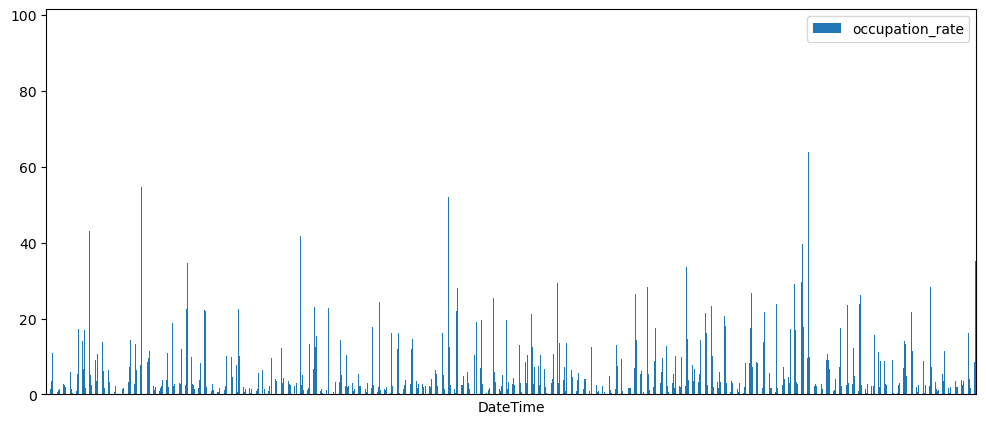

In [15]:
# Create a quick plot for the Champs Elysées data
ax = champs.plot.bar(x='DateTime', y='occupation_rate', rot= 0, figsize = (12,5))

# Remove xticks
ax.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False) # labels along the bottom edge are off
plt.show()

## Step 3: Group by day, hour and label & and mean on occupation rate 📅

### A few more data engineering to obtain interesting data

We will group the data by hour, day, and label, and then calculate the mean occupation rate. This will provide us with the average occupation rate for each road, broken down by hour on weekdays.

In [16]:
group_traffic=traffic.groupby(['label','day','hour'])['occupation_rate'].mean()
group_traffic_df = group_traffic.to_frame()
group_traffic_df = group_traffic.reset_index()
group_traffic_df

,label,day,hour,occupation_rate
0,4_Septembre,Friday,00:00:00+02:00,5.070641
1,4_Septembre,Friday,01:00:00+02:00,4.511780
2,4_Septembre,Friday,02:00:00+02:00,3.775807
3,4_Septembre,Friday,03:00:00+02:00,2.450668
4,4_Septembre,Friday,04:00:00+02:00,1.588753
...,...,...,...,...
89521,Winston_Churchill,Wednesday,19:00:00+02:00,3.154263
89522,Winston_Churchill,Wednesday,20:00:00+02:00,3.070418
89523,Winston_Churchill,Wednesday,21:00:00+02:00,2.846667
89524,Winston_Churchill,Wednesday,22:00:00+02:00,1.833615


We will now sort it by day and hour :

In [17]:
group_traffic_df['day'] = pd.Categorical(group_traffic_df['day'], categories=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'], ordered=True)
group_traffic_df['hour'] = pd.Categorical(group_traffic_df['hour'], categories=[f'{i:02d}:00:00+02:00' for i in range(24)], ordered=True)
group_traffic_df = group_traffic_df.sort_values(by=['day', 'hour'])
group_traffic_df['day'] = group_traffic_df['day'].astype(str)
group_traffic_df['hour'] = group_traffic_df['hour'].astype(str)
group_traffic_df['day_hour'] = group_traffic_df['day'] + ' ' + group_traffic_df['hour']
group_traffic_df

,label,day,hour,occupation_rate,day_hour
24,4_Septembre,Monday,00:00:00+02:00,4.120556,Monday 00:00:00+02:00
192,A3_bretelle_1,Monday,00:00:00+02:00,0.000000,Monday 00:00:00+02:00
360,A6A_W_bretelle_9,Monday,00:00:00+02:00,7.416667,Monday 00:00:00+02:00
528,AE_A3_bretelle_1,Monday,00:00:00+02:00,3.683333,Monday 00:00:00+02:00
696,AE_A4_bretelle_11,Monday,00:00:00+02:00,3.133333,Monday 00:00:00+02:00
...,...,...,...,...,...
88781,Vaugirard,Sunday,23:00:00+02:00,3.759133,Sunday 23:00:00+02:00
88949,Vercingetorix,Sunday,23:00:00+02:00,9.933640,Sunday 23:00:00+02:00
89117,Voie_Mazas,Sunday,23:00:00+02:00,10.783613,Sunday 23:00:00+02:00
89285,Vouille,Sunday,23:00:00+02:00,7.192082,Sunday 23:00:00+02:00


### Once again, let's observe the results on the Champs Elysées by creating a new bar plot of the road traffic data by day and hour

In [18]:
# Check out the data for Avenue des Champs Elysées
champs = group_traffic_df.loc[group_traffic_df["label"] == "Av_Champs_Elysees"]
champs

,label,day,hour,occupation_rate,day_hour
8261,Av_Champs_Elysees,Monday,00:00:00+02:00,4.248951,Monday 00:00:00+02:00
8262,Av_Champs_Elysees,Monday,01:00:00+02:00,3.659181,Monday 01:00:00+02:00
8263,Av_Champs_Elysees,Monday,02:00:00+02:00,3.221451,Monday 02:00:00+02:00
8264,Av_Champs_Elysees,Monday,03:00:00+02:00,1.775424,Monday 03:00:00+02:00
8265,Av_Champs_Elysees,Monday,04:00:00+02:00,1.401958,Monday 04:00:00+02:00
...,...,...,...,...,...
8328,Av_Champs_Elysees,Sunday,19:00:00+02:00,9.088299,Sunday 19:00:00+02:00
8329,Av_Champs_Elysees,Sunday,20:00:00+02:00,9.932284,Sunday 20:00:00+02:00
8330,Av_Champs_Elysees,Sunday,21:00:00+02:00,9.102102,Sunday 21:00:00+02:00
8331,Av_Champs_Elysees,Sunday,22:00:00+02:00,5.169192,Sunday 22:00:00+02:00


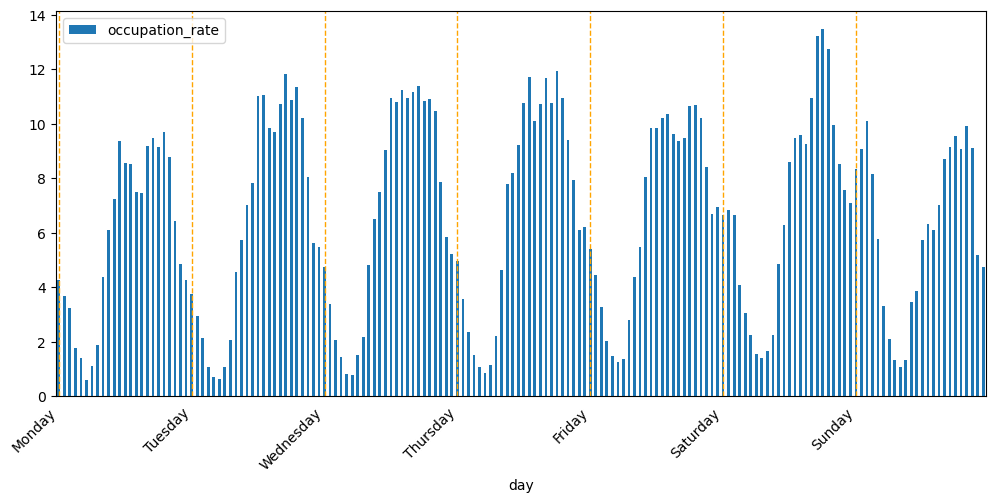

In [19]:
# Create a quick plot for Champs Elysées data
ax = champs.plot.bar(x='day', y='occupation_rate', rot= 0, figsize = (12,5))

# Remove xticks
ax.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=True) # labels along the bottom edge are off
ax.set_xticks(ax.get_xticks()[::24])

ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

for label in ax.get_xticklabels():
    xpos = label.get_position()[0]
    ax.axvline(x=xpos, color='orange', linewidth=1, linestyle='--')
    
plt.show()
# References: 
# [Remove xticks] https://stackoverflow.com/questions/12998430/remove-xticks-in-a-matplotlib-plot
# [Configure plot size] https://stackoverflow.com/questions/51174691/how-to-increase-image-size-of-pandas-dataframe-plot-in-jupyter-notebook/51174822

#### We can see some artificial weekly patterns in the daily data, so a 7-day average is necessary

In [20]:
# Calculate 7-day Simple Moving Average
# (takes around 2 minutes)
# Reference: https://www.datacamp.com/community/tutorials/moving-averages-in-pandas

# Set moving average window = 7 days
SMA_Window = 7

# Copy the dataframe
df = confirmed_daily

# Do calculation
for fips in df.countyFIPS.unique():
    for name in dailyCols:
        field = f'{name}_{SMA_Window}DayAverage'
        column_index = df.columns.get_loc(name)
        df.loc[df['countyFIPS'] == fips, field] = df.loc[df['countyFIPS'] == fips].iloc[:, column_index].rolling(window=SMA_Window).mean()  

NameError: name 'confirmed_daily' is not defined

In [24]:
# Round the moving average fields
movingAverageCols = [f'{name}_{SMA_Window}DayAverage' for name in dailyCols]
for name in movingAverageCols:
    df[name] = round(df[name])
df.tail()

,countyFIPS,DateTime,ConfirmedCases,County Name,State,population,DailyNewConfirmedCases,DailyNewConfirmedCases_7DayAverage
2416193,56045,2022-02-24,1538,Weston County,WY,6927,0.0,1.0
2416194,56045,2022-02-25,1538,Weston County,WY,6927,0.0,1.0
2416195,56045,2022-02-26,1538,Weston County,WY,6927,0.0,1.0
2416196,56045,2022-02-27,1538,Weston County,WY,6927,0.0,1.0
2416197,56045,2022-02-28,1541,Weston County,WY,6927,3.0,2.0


In [25]:
df.head(10)

,countyFIPS,DateTime,ConfirmedCases,County Name,State,population,DailyNewConfirmedCases,DailyNewConfirmedCases_7DayAverage
0,1001,2020-01-22,0,Autauga County,AL,55869,0.0,NaN
1,1001,2020-01-23,0,Autauga County,AL,55869,0.0,NaN
2,1001,2020-01-24,0,Autauga County,AL,55869,0.0,NaN
3,1001,2020-01-25,0,Autauga County,AL,55869,0.0,NaN
4,1001,2020-01-26,0,Autauga County,AL,55869,0.0,NaN
5,1001,2020-01-27,0,Autauga County,AL,55869,0.0,NaN
6,1001,2020-01-28,0,Autauga County,AL,55869,0.0,0.0
7,1001,2020-01-29,0,Autauga County,AL,55869,0.0,0.0
8,1001,2020-01-30,0,Autauga County,AL,55869,0.0,0.0
9,1001,2020-01-31,0,Autauga County,AL,55869,0.0,0.0


In [26]:
firstMADay = df['DateTime'].iloc[0] + pd.DateOffset(days=SMA_Window-1)
firstMADay

Timestamp('2020-01-28 00:00:00')

#### Also need to cut off the first 6 days since the first moving average value starts from 7th day

In [27]:
df_fromFirstMADay = df.loc[df['DateTime'] >= firstMADay]

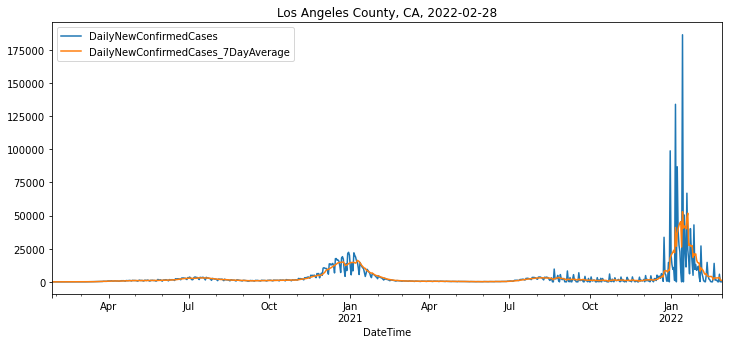

In [28]:
# Check moving average result for LA county - Daily new confirmed cases
FIPS = 6037 # LA
# FIPS = 36061 # Manhattan
# FIPS = 53033 # King County, WA
df = df_fromFirstMADay
currentDate = max(df['DateTime']).strftime("%Y-%m-%d")
countyName = df.loc[df['countyFIPS'] == FIPS, 'County Name'].iloc[0]
stateName = df.loc[df['countyFIPS'] == FIPS, 'State'].iloc[0]
plotTitle = f"{countyName}, {stateName}, {currentDate}"

df_LA = df.loc[df['countyFIPS'] == FIPS][['DateTime','DailyNewConfirmedCases', f'DailyNewConfirmedCases_{SMA_Window}DayAverage']]
df_LA = df_LA.set_index('DateTime')
lines = df_LA.plot.line(figsize = (12,5), title = plotTitle)
plt.show()

#### Export pandas dataframe to CSV

In [22]:
# Export pandas dataframe to CSV
today = date.today()
MA_csv = os.path.join(workFolder, f"road_analysis_{today}.csv")
traffic.to_csv(MA_csv)
MA_csv

'C:\\Users\\plouis\\OneDrive - esrifrance.fr\\Documents\\Confs\\2023\\EuroDev\\Notebooks_in_Pro\\Downloaded Data\\road_analysis_2023-10-30.csv'

## Step 4: Create Space Time Cube using Defined Locations with ArcPy 🎲

When using this data in a space time cube, the cases are aggregated spatially (counties) and temporally (daily, weekly, monthly).

This section will create space time cubes for each temporal aggregation. Additionally, we can also create cubes containing spatial and temporal subsets of the data: 
    - cube for one state, ex. California
    - cube for a certain time period, ex. 7/1/2020 - 12/31/2020.

#### We need to get a county layer for geometry 

I can retrieve data hosted on [ArcGIS Online](https://arcgis.com), where we can find a service containing [Paris road metering reference frame](https://esrifrance.maps.arcgis.com/home/item.html?id=dde41f6b77ca4488ad38eae1448cfe92&sublayer=1#overview). 

In [78]:
# Authenticate with a GIS using the ArcGIS API for Python
gis = arcgis.gis.GIS()

In [92]:
# Search for Paris road metering reference frame
search = gis.content.search("Ref comptage routier Paris", item_type="feature_service", outside_org=True, sort_field="numViews")
# Use the correct index to reference the search result
Paris_roads = search[0]
Paris_roads

<Item title:"Ref comptage routier Paris" type:Feature Layer Collection owner:plouis_esrifrance>

In [88]:
# Load the dataset into a spatially-enabled dataframe
Paris_roads_sedf = pd.DataFrame.spatial.from_layer(Paris_roads.layers[0])
Paris_roads_sedf = Paris_roads_sedf[['OBJECTID', 'label', 'SHAPE', 'Shape__Area', 'Shape__Length']]
Paris_roads_sedf

,OBJECTID,label,SHAPE,Shape__Area,Shape__Length
0,1,4_Septembre,"{""rings"": [[[2.34003601794791, 48.868850035201...",0.000001,0.015282
1,2,8_mai_1945,"{""rings"": [[[2.35637655473425, 48.876553007315...",0.000001,0.017678
2,3,A._Rivoire-D._Weill,"{""rings"": [[[2.3321728999594, 48.8169449483507...",0.000001,0.009754
3,4,A1_bretelle_8,"{""rings"": [[[2.35858415833229, 48.901499556059...",0.0,0.001612
4,5,A1_W,"{""rings"": [[[2.35862297037386, 48.902112699441...",0.0,0.003628
...,...,...,...,...,...
981,982,VGP_Souterrain_Tuileries,"{""rings"": [[[2.34038350069807, 48.858651410234...",0.000001,0.026567
982,983,Victor_Marchand,"{""rings"": [[[2.34278042237861, 48.828741487829...",0.0,0.002852
983,984,Voie_Mazas,"{""rings"": [[[2.36909438220005, 48.843998868553...",0.000001,0.009794
984,985,Vouille,"{""rings"": [[[2.31149068904409, 48.832664943032...",0.000001,0.019127


In [91]:
# Save the spatially-enabled dataframe into a Feature Class
counties_fc = Paris_roads_sedf.spatial.to_featureclass(os.path.join(workGDB, "Paris_road_ref"))

#### Helper function to convert CSV to a Space Time Cube

We are goiong to create a Space Time Cube using the [Create Space Time Cube From Defined Locations](https://pro.arcgis.com/en/pro-app/latest/tool-reference/space-time-pattern-mining/createcubefromdefinedlocations.htm) tool with ArcPy
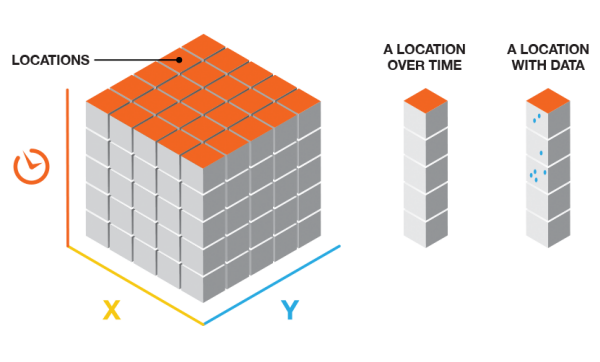

In [1]:
arcpy.stpm.CreateSpaceTimeCubeDefinedLocations(
    in_features="Paris_road_ref_Project",
    output_cube=r"C:\Users\plouis\OneDrive - esrifrance.fr\Documents\Confs\2023\EuroDev\Notebooks_in_Pro\cube_roads_oct23.nc",
    location_id="label",
    temporal_aggregation="APPLY_TEMPORAL_AGGREGATION",
    time_field="DateTime",
    time_step_interval="1 Months",
    time_step_alignment="END_TIME",
    reference_time=None,
    variables=None,
    summary_fields="occupation_rate MEAN ZEROS",
    in_related_table=r"C:\Users\plouis\OneDrive - esrifrance.fr\Documents\Confs\2023\EuroDev\Notebooks_in_Pro\Downloaded Data\road_analysis_2023-10-30.csv",
    related_location_id="label"
)

ExecuteError: ERROR 110150: Invalid input: The input Related Table does not have an ObjectID field.
Failed to execute (CreateSpaceTimeCubeDefinedLocations).


In [33]:
def createCubeFromCSV_withMA(csvWithPath, workFolder, daily = True, weekly = False, monthly = False):
    ### Function to create cube with 7-day moving average & per 100K residents ###
    ### Also can aggregate daily data to weekly and monthly (30-day actually) ###
    csv = os.path.basename(csvWithPath)
    tb = csv.split(".")[0]
    # output cube = use the same name with CSV, will be saved at workFolder
    outputCube = os.path.join(workFolder, tb + ".nc")
    
    # template feature = US counties polygons
    gdb = workGDB
    templateFC = os.path.join(workGDB, "Paris_road_ref_Project")
    # Convert csv to a table in data.gdb
    print(csvWithPath)
    print(gdb)
    print(tb)
    arcpy.conversion.TableToTable(csvWithPath, gdb, tb)
    tbName = os.path.join(gdb, tb)
    
    if daily:
        # Create Space Time Cube From Defined Locations - daily
        arcpy.stpm.CreateSpaceTimeCubeDefinedLocations(templateFC, outputCube, "label", "NO_TEMPORAL_AGGREGATION", None, tbName, "label")
        print("daily cube created")
    
    if weekly:
        # Create Space Time Cube From Defined Locations - weekly aggregation
        outputCube_weekly = os.path.join(workFolder, f"{tb}_1week.nc")
        arcpy.stpm.CreateSpaceTimeCubeDefinedLocations(templateFC, outputCube_weekly, "label", "APPLY_TEMPORAL_AGGREGATION", "DateTime", "1 Weeks", "END_TIME", None, None, "occupation_rate MEAN SUM DROP_LOCATIONS", tbName, "label")
        print("weekly cube created")
    
    if monthly:
        # Create Space Time Cube From Defined Locations - 30-Day aggregation
        outputCube_monthly = os.path.join(workFolder, f"{tb}_30days.nc")
        arcpy.stpm.CreateSpaceTimeCubeDefinedLocations(templateFC, outputCube_monthly, "label", "APPLY_TEMPORAL_AGGREGATION", "DateTime", "30 Days", "END_TIME", None, None, "occupation_rate MEAN DROP_LOCATIONS", tbName, "label")
        print("monthly cube created")
    return

##### This step may take a few moments to run...

In [34]:
# Create cube with 7-day moving average & per 100K residents
createCubeFromCSV_withMA(MA_csv, workFolder, daily=True, weekly=True, monthly=False)

C:\Users\plouis\OneDrive - esrifrance.fr\Documents\Confs\2023\EuroDev\Notebooks_in_Pro\Downloaded Data\road_analysis_2023-10-30.csv
C:\Users\plouis\OneDrive - esrifrance.fr\Documents\Confs\2023\EuroDev\Notebooks_in_Pro\Notebooks_in_Pro.gdb
road_analysis_2023-10-30


ExecuteError: Failed to execute. Parameters are not valid.
ERROR 000354: The name contains invalid characters
Failed to execute (TableToTable).


#### Optional: Create cube for selected counties or state.

In [40]:
# Create small cube for five counties in NYC
FIPS = [36061, 36085, 36005, 36047, 36081]
nyc_csv = os.path.join(workFolder, f'confirmed_NYC_thru_{date}.csv')
df_nyc = df_copy.loc[df_copy['countyFIPS'].isin(FIPS)]
df_nyc.to_csv(nyc_csv)
createCubeFromCSV_withMA(nyc_csv, workFolder)

daily cube created


In [41]:
# Create small cube for California
ca_csv = os.path.join(workFolder, f'confirmed_CA_thru_{date}.csv')
df_CA = df_copy.loc[(df_copy['countyFIPS'] >= 6000) & (df_copy['countyFIPS'] <= 6115)]
df_CA.to_csv(ca_csv)
createCubeFromCSV_withMA(ca_csv, workFolder)

daily cube created


In [42]:
# Create small cube for Florida
fl_csv = os.path.join(workFolder, f'confirmed_FL_thru_{date}.csv')
df_FL= df_copy.loc[(df_copy['countyFIPS'] >= 12001) & (df_copy['countyFIPS'] <= 12999)]
df_FL.to_csv(fl_csv)
createCubeFromCSV_withMA(fl_csv, workFolder)

daily cube created


#### Optional: Create cube for selected time period

In [43]:
# Create cube for a certain time period
start_date = '2021-11-01'
end_date = '2022-02-15'
separator = ''
startDateString = separator.join(start_date.split('-')[1:])
endDateString = separator.join(end_date.split('-')[1:])
certainDates_csv = os.path.join(workFolder, f'confirmed_from_{startDateString}_to_{endDateString}.csv')

df_only_certainDates = df_copy.loc[(df_fromFirstMADay['DateTime'] >= start_date) & (df_copy['DateTime'] <= end_date)]
df_only_certainDates.to_csv(certainDates_csv)
createCubeFromCSV_withMA(certainDates_csv, workFolder)

daily cube created


# 2. Data Visualization 📊

Reference: 
<a href="https://www.arcgis.com/home/item.html?id=5e08c75b489c416ca607f8a6a7f5c344" target="_blank">ArcGIS Notebook - Using Arcpy Charts to Visualize COVID</a>

- <b>Bar Chart</b>: Total Covid-19 Cases by County 
- <b>Calendar Heat Chart</b>: Total COVID-19 Cases by Day and Month
- <b>Matrix Heat Chart</b>: Daily COVID-19 Cases by County

In [44]:
# Read the table of California from Contents in your activated Map
groupField = 'County_Name'
table = arcpy.mp.ArcGISProject('current').activeMap.listTables()[0]
table.name

'confirmed_0228'

In [45]:
# If we are interested in the nation-wide situation and group by States, run this cell to use a different table
groupField = 'State'
table = arcpy.mp.ArcGISProject('current').activeMap.listTables()[0]
table.name

'confirmed_0228'

First, start with a simple <b>bar chart showing the total COVID cases for each county in Califronia</b>. 

To do so, we initialize an ArcPy Chart object c and configuring the properties: type of chart, title, axis fields, axis titles, sorted by descending of Y axis values, and display size (width, length). Since there are multile rows for each date of a single county, we use a sum aggregation to calculate the total daily new cases as the total confirmed cases for each county, by chart object's `bar.aggregation` property. Also take note of the dataSource property, which is pointed to the table variable read in the previous cell(s), to specify the feature layer/stand-alone table you want to create chart based off. If it's not listed in TOC, you can point it to the full path of the feature class. 

After the ArcPy Chart object is created, we can: 1) export it to a local SVG file by the chart object's `exportToSVG` method, 2) add it to the feature layer/stand-alone table in TOC by the `addToLayer` method, 3) show under the cell in ArcGIS Notebook.


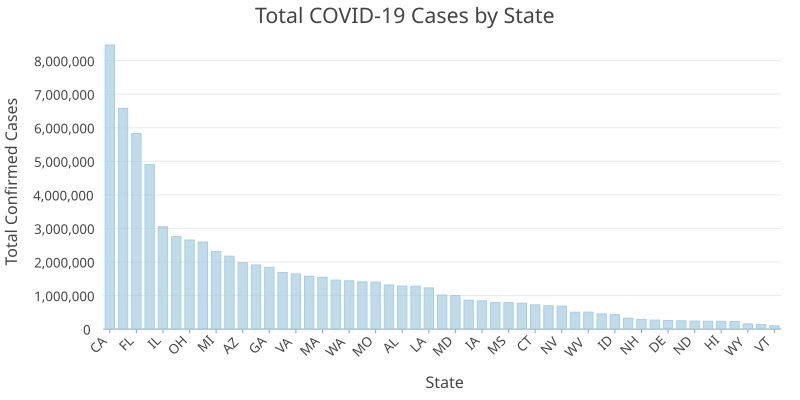

In [46]:
c = arcpy.Chart('covid19_sum_by_county_desc')
c.type = 'bar'
groupTitle = groupField.split('_')[0]
c.title = f"Total COVID-19 Cases by {groupTitle}"
c.xAxis.field = groupField
c.xAxis.title = groupTitle
c.yAxis.field = 'DailyNewConfirmedCases'
c.yAxis.title = "Total Confirmed Cases"
c.yAxis.sort = 'DESC'
c.bar.aggregation = 'sum'
c.displaySize = 800, 400
c.dataSource = table
# c.exportToSVG('covid19_sum_by_county_desc.svg')
c.addToLayer(table) 
c

We can also view aggregated COVID-19 cases over time from a slightly different perspective by creating a <a href="https://pro.arcgis.com/en/pro-app/latest/help/analysis/geoprocessing/charts/calendar-heat-chart.htm" target="_blank">calendar heat chart</a>. <b>This chart aggregates daily new cases of all counties in California and displays them in a calendar grid.</b> The calendar heat chart is effective at showing a per day summary of temporal data, and the color for each cell is determined by a graduated natural breaks scheme.

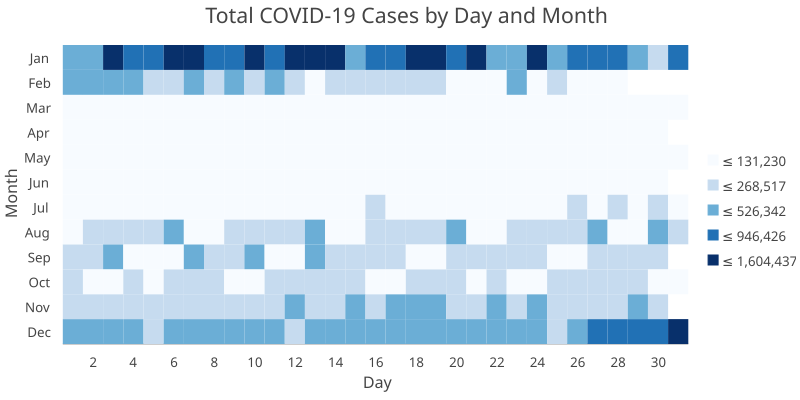

In [47]:
c = arcpy.Chart('covid19_calendar')
c.type = 'calendarHeatChart'
c.title = "Total COVID-19 Cases by Day and Month"
c.xAxis.field = 'DateTime'
c.xAxis.title = "Day"
c.yAxis.field = 'DailyNewConfirmedCases'
c.yAxis.title = "Month"
c.calendarHeatChart.aggregation = 'sum'
c.displaySize = 800, 400
c.dataSource = table
# c.exportToSVG('covid19_calendar.svg')
c.addToLayer(table) 
c

Having visualized the daily new COVID-19 cases aggregated for the entire state, we may also be interested in <b>comparing daily cases between counties within California</b>. 

New in ArcGIS Pro 2.7, we can display this data by creating a <a href="https://pro.arcgis.com/en/pro-app/latest/help/analysis/geoprocessing/charts/matrix-heat-chart.htm#GUID-44D462F3-5E67-46DD-BD1C-862003D2EA5C" target="_blank">matrix heat chart</a> to display each county in a separate row. Matrix heat charts are used to visualize relationships between categorical or date fields with a grid of shaded cells. Here we will view each day on the X-axis by set the chart object's `xAxis.field` property, or Column category in the Chart Properties Pane. To view each county on the Y-axis, and use `DailyNewConfirmedCases` field to determine the intensity of the cell shading, we need to parse a list of the two Field names to the chart object's `yAxis.field` property. Also we can specify the symbology of the cell shading using 7-category Natural Breaks.

In [48]:
c = arcpy.Chart('covid19_daily_by_county')
c.type = 'matrixHeatchart'
c.title = f"Daily COVID-19 Cases by {groupTitle}"
c.xAxis.field = 'DateTime'
c.xAxis.title = 'Day'
c.yAxis.field = [groupField, 'DailyNewConfirmedCases']
c.yAxis.title = groupTitle
c.matrixHeatChart.aggregation = 'sum'
c.matrixHeatChart.classificationMethod = 'naturalBreaks'
c.matrixHeatChart.classCount = 7
c.matrixHeatChart.nullPolicy = 'zero'
c.legend.title = "Number of Cases"
c.displaySize = 800, 1200
c.dataSource = table
# c.exportToSVG('covid19_daily_by_county.svg')
c.addToLayer(table)
c

# 3. Analysis 🧪

There are various tools that can be used to analyze COVID-19 cases across space and time. In this section, we'll apply two methods: 
- Time Series Clustering ⏱
- Change Point Detection 📈

By using a notebook and recording the arcpy calls in this script, we can make it easy to repeat and share the analysis. 

## Time Series Clustering ⏱

In [12]:
def clustering(inCube, field, outputName, runProfile = True, runFourier = True, runValue= False, numClusters = None, ignore = None, createPopups = True):
    """ Cluster with three Characteristics of Interests together 
    
    Keyword arguments:
    inCube -- Input Space Time Cube with full path (string)
    field -- Cube Variable (string)
    runProfile -- Boolean for using Profile (Correlation) as character of interest (boolean, default = True)
    runFourier -- Boolean for using Profile (Fourier) as character of interest (boolean, default = True)
    runValue -- Boolean for using Value as character of interest (boolean, default = False)
    numClusters -- Number of clusters (int, default = None, auto-detect the optimal # clsuter with min F-stats)
    ignore -- Time Series Characteristics to Ignore, "TIME_LAG"|"RANGE" (string, default = None)
    createPopups -- Boolean for Enable Time Series Pop-ups in output feature (boolean, default = True)
    """
    # Run Profile (Correlation)
    if runProfile:
        outputFc = os.path.join(workGDB, f"{outputName}_TSC_Profile")
        outputChart = os.path.join(workGDB, f"{outputName}_TSC_Profile_Charts")
        arcpy.stpm.TimeSeriesClustering(inCube, field, outputFc, "PROFILE", numClusters, outputChart, None, createPopups)
    # Run Profile (Fourier)
    if runFourier:
        outputFc = os.path.join(workGDB, f"{outputName}_TSC_Fourier")
        outputChart = os.path.join(workGDB, f"{outputName}_TSC_Fourier_Charts")
        arcpy.stpm.TimeSeriesClustering(inCube, field, outputFc, "PROFILE_FOURIER", numClusters, outputChart, ignore, createPopups)
    # Run Profile (Value)
    if runValue:
        outputFc = os.path.join(workGDB, f"{outputName}_TSC_Value")
        outputChart = os.path.join(workGDB, f"{outputName}_TSC_Value_Charts")
        arcpy.stpm.TimeSeriesClustering(inCube, field, outputFc, "VALUE", numClusters, outputChart, None, createPopups)
    return

#### This cell will take a significantly long time to run...

In [50]:
# Input parameters for time series clustering
cube = f"confirmed_{date}.nc"
inCube = os.path.join(workFolder, cube)
field = "DAILYNEWCONFIRMEDCASES_7DAYAVERAGE_PER100K"
outputName = f"US_7dayAvgDailyCasesPer100K_thru_{date}"

# Clustering
clustering(inCube, field, outputName)

## Change Point Detection 📈

In [51]:
def changepoint(inCube, field, outputName, runMean=True, runCount=True, runStdDev=True, runSlope=False):
    """ Cluster with three Characteristics of Interests together 
    
    Keyword arguments:
    inCube -- Input Space Time Cube with full path (string)
    field -- Cube Variable (string)
    outputName -- Output name for the layer (string)
    runMean -- Boolean for using Mean change point detection (boolean, default = True)
    runCount -- Boolean for using Mean change point detection (boolean, default = True)
    runStdDev -- Boolean for using Mean change point detection (boolean, default = True)
    numSlope -- Boolean for using Mean change point detection (boolean, default = True)

    createPopups -- Boolean for Enable Time Series Pop-ups in output feature (boolean, default = True)
    """
    if runMean:
        outputFc = os.path.join(workGDB, f"{outputName}_CPD_Mean")
        arcpy.stpm.ChangePointDetection(inCube, field, outputFc, "MEAN", "AUTO_DETECT", 1, 0.5)
    if runCount:
        outputFc = os.path.join(workGDB, f"{outputName}_CPD_Count")
        arcpy.stpm.ChangePointDetection(inCube, field, outputFc, "COUNT", "AUTO_DETECT", 1, 0.5)        
    if runStdDev:
        outputFc = os.path.join(workGDB, f"{outputName}_CPD_StdDev")
        arcpy.stpm.ChangePointDetection(inCube, field, outputFc, "STANDARD_DEVIATION", "AUTO_DETECT", 1, 0.5)   
    if runSlope:
        outputFc = os.path.join(workGDB, f"{outputName}_CPD_Slope")
        arcpy.stpm.ChangePointDetection(inCube, field, outputFc, "SLOPE", "AUTO_DETECT", 1, 0.5)           
    return

#### This cell will take a few minutes to run...

In [52]:
# Input parameters for time series clustering
cube = f"confirmed_{date}.nc"
inCube = os.path.join(workFolder, cube)
field = "DAILYNEWCONFIRMEDCASES_7DAYAVERAGE_PER100K"
outputName = f"US_7dayAvgDailyCasesPer100K_thru_{date}"

# Change Point Detection
changepoint(inCube, field, outputName)